#Mount

In [1]:
from google.colab import drive
drive.mount('/drive')

driveDir = "../drive/My Drive/Colab Notebooks/PollenImageClassification/MicroscopeImagesandVideos/"



Mounted at /drive


#Terms

##Color Spaces

HSV - Hue Saturation Value

[anisotropic diffusion](https://en.wikipedia.org/wiki/Anisotropic_diffusion) - reducing image noise without removing significant parts of the image content, typically edges, lines or other details

[affine transformation](https://en.wikipedia.org/wiki/Affine_transformation) - geometric transformation that preserves points, straight lines,
and planes. Lines that are parallel before the transform remain parallel post-application of
the transform. For every pixel x in an image, the affine transformation can be represented
by the mapping, x |→ Mx+b, where M is a linear transform (matrix) and b is an offset
vector.

[perspective transformation and homography](https://subscription.packtpub.com/book/data/9781789537147/1/ch01lvl1sec05/applying-perspective-transformation-and-homography#:~:text=The%20goal%20of%20perspective%20(projective,homography%20matrix%20from%20two%20images.) -  perspective (projective) transform is to estimate homography (a matrix, H) from point correspondences between two images. Since the matrix has a Depth Of Field (DOF) of eight, you need at least four pairs of points to compute the homography matrix from two images

Image Resoration - recover corrupted image
by modeling the degradation process with prior knowledge (for example, the degradation
filter is assumed to be known in most of the cases). Then, it improves the image by
applying an inverse process to restore the original image.

Wiener filter - Mean Squared Error (MSE) filtering that incorporates both the
degradation function and the statistical characteristics of noise. The underlying assumption
is that the noise and image are uncorrelated. It optimizes the filter so that MSE is
minimized

Constrained Least
Squares (CLS) filter - an
inverse (least squares) filter with an additional smoothness constraint that does not allow
arbitrary high-frequency fluctuation in the restored image by imposing a smoothness
constraint

Markov random field (MRF) - Let's say we have a noisy binary image, X, with pixel values Xij ∈ {-1, +1} and we
want to recover the noiseless image, Y. If the amount of noise is assumed to be small, there
will be a good correlation between a pixel in X and the corresponding pixel in Y and in a 4-
connected neighborhood, pixels of X will be well-correlated.

image compression using wavelets -transform an image and discard the
lower-order bits from the output of the transform, so that most of its values are zero (or
very small), but most of the signal (pixels) is preserved

##Useful Class

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import copy

class ImageProcessing():
    def __init__(self,imgDir):
        self.imgDir = imgDir
        self.image = self.readImg()

    def readImg(self):
        startImg = cv2.imread(self.imgDir)
        self.image = np.array(startImg)
        return self.image

    #Image read in as BGR
    def showImg(self,BGR = True):
        imgCopy = copy.copy(self.image)
        if BGR:
            imgCopy = cv2.cvtColor(imgCopy,cv2.COLOR_BGR2RGB)    
        plt.imshow(imgCopy)
        plt.show()

    #Image read in as BGR
    def showNewImg(self,image= None,BGR = True):
        imgCopy = copy.copy(image)
        if BGR:
            imgCopy = cv2.cvtColor(imgCopy,cv2.COLOR_BGR2RGB)    
        plt.imshow(imgCopy)
        plt.show()  

#Chapter 1 Image Transforms



##Transforming color space (RGB → Lab)



/usr/local/lib/python3.6/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 73720 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


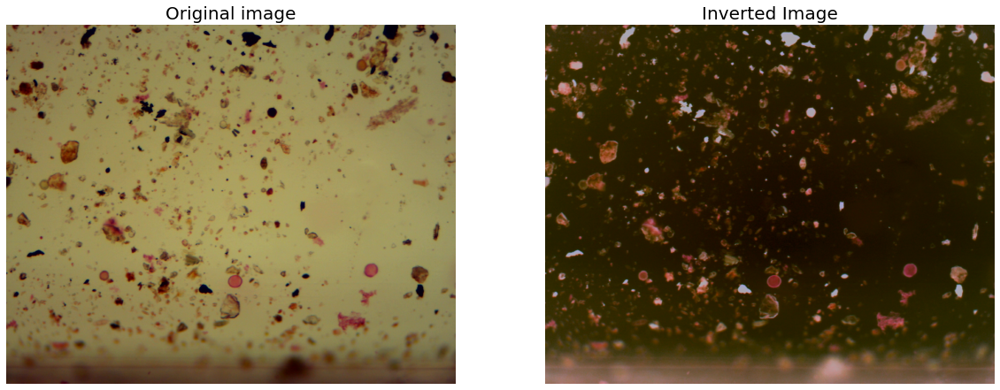

In [ ]:
import numpy as np
from skimage.io import imread
from skimage.color import rgb2lab, lab2rgb
import matplotlib.pylab as plt

im = imread(driveDir+"test.jpg")
im1 = rgb2lab(im)
im1[...,0] = np.max(im1[...,0]) - im1[...,0]
im1 = lab2rgb(im1)
plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im), plt.axis('off'),
plt.title('Original image', size=20)
plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Inverted Image', size=20)
plt.show()

##Applying affine transformation 
- geometric transformation that preserves points, straight lines,
and planes. Lines that are parallel before the transform remain parallel post-application of
the transform. For every pixel x in an image, the affine transformation can be represented
by the mapping, x |→ Mx+b, where M is a linear transform (matrix) and b is an offset
vector.



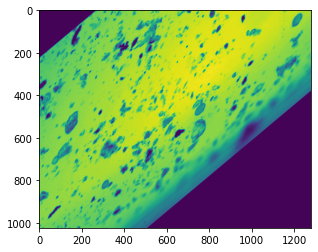

In [ ]:
import numpy as np
from scipy import ndimage as ndi
from skimage.io import imread
from skimage.color import rgb2gray

img = rgb2gray(imread(driveDir+"test.jpg"))
w, h = img.shape

#Apply identity transform:
mat_identity = np.array([[1,0,0],[0,1,0],[0,0,1]])
img1 = ndi.affine_transform(img, mat_identity)

#Apply reflection transform (along the x axis):
mat_reflect = np.array([[1,0,0],[0,-1,0],[0,0,1]]) @ np.array([[1,0,0],[0,1,-h],[0,0,1]])
img1 = ndi.affine_transform(img, mat_reflect) # offset=(0,h)

#Scale the image (0.75 times along the x axis and 1.25 times along the y axis):
s_x, s_y = 0.75, 1.25
mat_scale = np.array([[s_x,0,0],[0,s_y,0],[0,0,1]])
img1 = ndi.affine_transform(img, mat_scale)

#Rotate the image by 30° counter-clockwise. It's a composite operation—first, you
#will need to shift/center the image, apply rotation, and then apply inverse shift:
theta = np.pi/6
mat_rotate = np.array([[1,0,w/2],[0,1,h/2],[0,0,1]]) @ np.array([[np.cos(theta),np.sin(theta),0],[np.sin(theta),- np.cos(theta),0],[0,0,1]]) @ np.array([[1,0,-w/2],[0,1,-h/2],[0,0,1]])
img1 = ndi.affine_transform(img1, mat_rotate)

#Apply shear transform to the image:
lambda1 = 0.5
mat_shear = np.array([[1,lambda1,0],[lambda1,1,0],[0,0,1]])
img1 = ndi.affine_transform(img1, mat_shear)

#Finally apply all of the transforms together, in sequence:
mat_all = mat_identity @ mat_reflect @ mat_scale @ mat_rotate @ mat_shear

#Show Image
plt.imshow(ndi.affine_transform(img, mat_all))
plt.show()



##Applying perspective transformation and homography



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


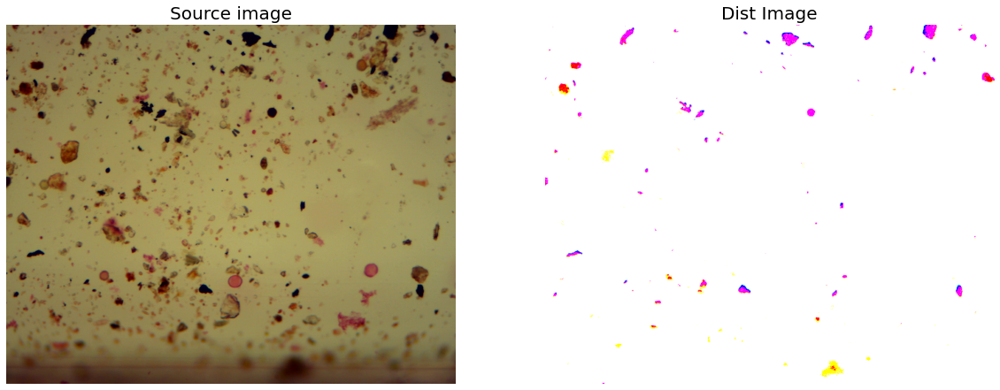

In [ ]:
from skimage.transform import ProjectiveTransform
from skimage.io import imread
import numpy as np
import matplotlib.pylab as plt

#First, read the source image and create a destination image with the np.zeros() function:
im_src = imread(driveDir+"test.jpg")
height, width, dim = im_src.shape
im_dst = np.zeros((height, width, dim))

#2. Create an instance of the ProjectiveTransform class:
pt = ProjectiveTransform()

#You just need to provide four pairs of matching points between the source and
#destination images to estimate the homography matrix, H, automatically for you.
src = np.array([[ 295., 174.],
[ 540., 146. ],
[ 400., 777.],
[ 60., 422.]])
dst = np.array([[ 0., 0.],
[height-1, 0.],
[height-1, width-1],
[ 0., width-1]])

#Obtain the source pixel index corresponding to each pixel index in the destination:
x, y = np.mgrid[:height, :width]
dst_indices = np.hstack((x.reshape(-1, 1), y.reshape(-1,1)))
src_indices = np.round(pt.inverse(dst_indices), 0).astype(int)
valid_idx = np.where((src_indices[:,0] < height) & (src_indices[:,1] < width) & (src_indices[:,0] >= 0) & (src_indices[:,1] >=0))
dst_indicies_valid = dst_indices[valid_idx]
src_indicies_valid = src_indices[valid_idx]

#Copy pixels from the source to the destination images:
im_dst[dst_indicies_valid[:,0],dst_indicies_valid[:,1]] = im_src[src_indicies_valid[:,0],src_indicies_valid[:,1]]

plt.figure(figsize=(20,10))
plt.subplot(121), plt.imshow(im_src), plt.axis('off'),
plt.title('Source image', size=20)
plt.subplot(122), plt.imshow(im_dst), plt.axis('off'), plt.title('Dist Image', size=20)
plt.show()

##Creating pencil sketches from images



/usr/local/lib/python3.6/dist-packages/medpy/filter/smoothing.py:155: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  deltas[i][slicer] = numpy.diff(out, axis=i)
/usr/local/lib/python3.6/dist-packages/medpy/filter/smoothing.py:164: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  matrices[i][slicer] = numpy.diff(matrices[i], axis=i)


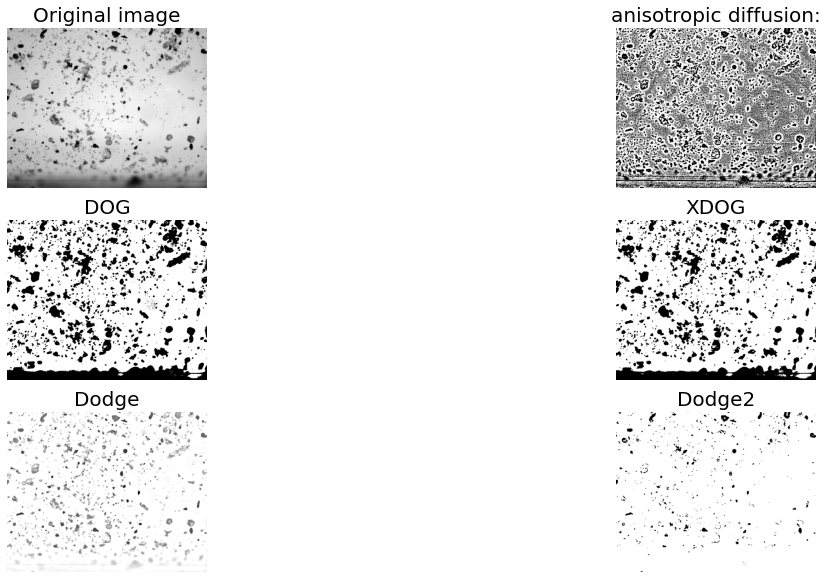

In [ ]:
import numpy as np
from skimage.io import imread
from skimage.color import rgb2gray
from skimage import util
from skimage import img_as_float
import matplotlib.pylab as plt
!pip install medpy
from medpy.filter.smoothing import anisotropic_diffusion
from skimage.filters import gaussian, threshold_otsu

def normalize(img):
    return (img-np.min(img))/(np.max(img)-np.min(img))

def sketch(img, edges):
    output = np.multiply(img, edges)
    output[output>1]=1
    output[edges==1]=1
    return output

def edges_with_anisotropic_diffusion(img, niter=100, kappa=10,gamma=0.1):
    output = img - anisotropic_diffusion(img, niter=niter, kappa=kappa, gamma=gamma, voxelspacing=None,option=1)
    output[output > 0] = 1
    output[output < 0] = 0
    return output

def sketch_with_dodge(img):
    orig = img
    blur = gaussian(util.invert(img), sigma=20)
    result = blur / util.invert(orig)
    result[result>1] = 1
    result[orig==1] = 1
    return result

def edges_with_dodge2(img):
    img_blurred = gaussian(util.invert(img), sigma=5)
    output = np.divide(img, util.invert(img_blurred) + 0.001)
    output = normalize(output)
    thresh = threshold_otsu(output)
    output = output > thresh
    return output

def edges_with_DOG(img, k = 200, gamma = 1):
    sigma = 0.5
    output = gaussian(img, sigma=sigma) - gamma*gaussian(img, \
    sigma=k*sigma)
    output[output > 0] = 1
    output[output < 0] = 0
    return output

def sketch_with_XDOG(image, epsilon=0.01):
    phi = 10
    difference = edges_with_DOG(image, 200, 0.98).astype(np.uint8)
    for i in range(0, len(difference)):
        for j in range(0, len(difference[0])):
            if difference[i][j] >= epsilon:
                difference[i][j] = 1
            else:
                ht = np.tanh(phi*(difference[i][j] - epsilon))
                difference[i][j] = 1 + ht
    difference = normalize(difference)
    return difference

im = rgb2gray(imread(driveDir+"test.jpg"))
imNorm = normalize(im)
imAniDiff = sketch(im,edges_with_anisotropic_diffusion(im))

imDOG = sketch(im,edges_with_DOG(im))
imXDOG = sketch_with_XDOG(im)

imDodge = sketch_with_dodge(im)
imDodge2 = sketch(im,edges_with_dodge2(im))


plt.figure(figsize=(20,10))
plt.subplot(321), plt.imshow(imNorm,cmap="gray"), plt.axis('off'), plt.title('Original image', size=20)
plt.subplot(322), plt.imshow(imAniDiff,cmap="gray"), plt.axis('off'), plt.title('anisotropic diffusion:', size=20)
plt.subplot(323), plt.imshow(imDOG,cmap="gray"), plt.axis('off'), plt.title('DOG', size=20)
plt.subplot(324), plt.imshow(imXDOG,cmap="gray"), plt.axis('off'), plt.title('XDOG', size=20)
plt.subplot(325), plt.imshow(imDodge,cmap="gray"), plt.axis('off'), plt.title('Dodge', size=20)
plt.subplot(326), plt.imshow(imDodge2,cmap="gray"), plt.axis('off'), plt.title('Dodge2', size=20)
plt.show()

Creating cartoonish images



Simulating light art/long exposure



##Object detection using color in HSV

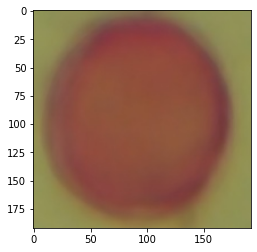

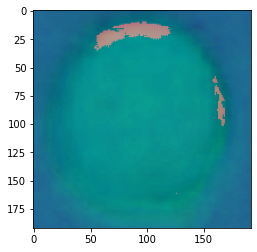

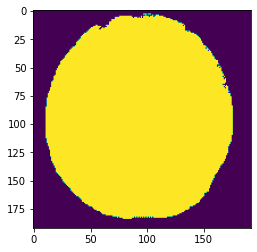

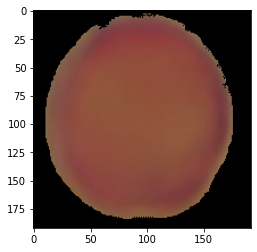

In [ ]:
import cv2
import numpy as np
import matplotlib.pylab as plt

img = cv2.cvtColor(cv2.imread(driveDir+"mask.jpg"),cv2.COLOR_BGR2RGB)

plt.imshow(img)
plt.show()

hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

plt.imshow(hsv)
plt.show()


low_red = cv2.inRange(hsv, (0, 100, 100), (15, 255, 255))
up_red = cv2.inRange(hsv, (160, 100, 100), (179, 255, 255))
mask = low_red + up_red



plt.imshow(mask)
plt.show()

imask = mask>0
orange = np.zeros_like(img, np.uint8)
orange[imask] = img[imask]

##Able to perfectly isolate the pollen grain mask
plt.imshow(orange)
plt.show()





##Chap 1 Class

In [ ]:
from skimage.io import imread
from skimage.color import rgb2lab, lab2rgb

from scipy import ndimage as ndi
from skimage.io import imread
from skimage.color import rgb2gray

from skimage.transform import ProjectiveTransform
#from skimage.io import imread
class ImageTransforms(ImageProcessing):
    def __init__(self,imgDir):
        super().__init__(imgDir)
        self.image = self.readImg()

    def transformColorSpace(self,imIsBGR = True):
        if imIsBGR:
              imgCopy = cv2.cvtColor(self.image,cv2.COLOR_BGR2RGB) 
        im1 = rgb2lab(imgCopy)
        im1[...,0] = np.max(im1[...,0]) - im1[...,0]
        im1 = lab2rgb(im1)
        plt.figure(figsize=(20,10))
        plt.subplot(121), plt.imshow(imgCopy), plt.axis('off'),
        plt.title('Original image', size=20)
        plt.subplot(122), plt.imshow(im1), plt.axis('off'), plt.title('Inverted Image', size=20)
        plt.show()

    def transformAffine(self):
        img = cv2.cvtColor(self.image,cv2.COLOR_BGR2GRAY)
        w, h = img.shape

        #Apply identity transform:
        mat_identity = np.array([[1,0,0],[0,1,0],[0,0,1]])
        img1 = ndi.affine_transform(img, mat_identity)

        #Apply reflection transform (along the x axis):
        mat_reflect = np.array([[1,0,0],[0,-1,0],[0,0,1]]) @ np.array([[1,0,0],[0,1,-h],[0,0,1]])
        img1 = ndi.affine_transform(img, mat_reflect) # offset=(0,h)

        #Scale the image (0.75 times along the x axis and 1.25 times along the y axis):
        s_x, s_y = 0.75, 1.25
        mat_scale = np.array([[s_x,0,0],[0,s_y,0],[0,0,1]])
        img1 = ndi.affine_transform(img, mat_scale)

        #Rotate the image by 30° counter-clockwise. It's a composite operation—first, you
        #will need to shift/center the image, apply rotation, and then apply inverse shift:
        theta = np.pi/6
        mat_rotate = np.array([[1,0,w/2],[0,1,h/2],[0,0,1]]) @ np.array([[np.cos(theta),np.sin(theta),0],[np.sin(theta),- np.cos(theta),0],[0,0,1]]) @ np.array([[1,0,-w/2],[0,1,-h/2],[0,0,1]])
        img1 = ndi.affine_transform(img1, mat_rotate)

        #Apply shear transform to the image:
        lambda1 = 0.5
        mat_shear = np.array([[1,lambda1,0],[lambda1,1,0],[0,0,1]])
        img1 = ndi.affine_transform(img1, mat_shear)

        #Finally apply all of the transforms together, in sequence:
        mat_all = mat_identity @ mat_reflect @ mat_scale @ mat_rotate @ mat_shear

        
        #Show Image
        plt.imshow(ndi.affine_transform(img, mat_all))
        plt.show()

    def transformPerspective(self):
        #First, read the source image and create a destination image with the np.zeros() function:
        im_src = cv2.cvtColor(self.image,cv2.COLOR_BGR2RGB)
        height, width, dim = im_src.shape
        im_dst = np.zeros((height, width, dim))

        #2. Create an instance of the ProjectiveTransform class:
        pt = ProjectiveTransform()

        #You just need to provide four pairs of matching points between the source and
        #destination images to estimate the homography matrix, H, automatically for you.
        src = np.array([[ 295., 174.],
        [ 540., 146. ],
        [ 400., 777.],
        [ 60., 422.]])
        dst = np.array([[ 0., 0.],
        [height-1, 0.],
        [height-1, width-1],
        [ 0., width-1]])

        #Obtain the source pixel index corresponding to each pixel index in the destination:
        x, y = np.mgrid[:height, :width]
        dst_indices = np.hstack((x.reshape(-1, 1), y.reshape(-1,1)))
        src_indices = np.round(pt.inverse(dst_indices), 0).astype(int)
        valid_idx = np.where((src_indices[:,0] < height) & (src_indices[:,1] < width) & (src_indices[:,0] >= 0) & (src_indices[:,1] >=0))
        dst_indicies_valid = dst_indices[valid_idx]
        src_indicies_valid = src_indices[valid_idx]

        #Copy pixels from the source to the destination images:
        im_dst[dst_indicies_valid[:,0],dst_indicies_valid[:,1]] = im_src[src_indicies_valid[:,0],src_indicies_valid[:,1]]

        plt.figure(figsize=(20,10))
        plt.subplot(121), plt.imshow(im_src), plt.axis('off'),
        plt.title('Source image', size=20)
        plt.subplot(122), plt.imshow(im_dst), plt.axis('off'), plt.title('Dist Image', size=20)
        plt.show()

    def detectObjects(self):
        img = cv2.cvtColor(self.image, cv2.COLOR_BGR2RGB)

        self.showImg()

        hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)

        self.showNewImg(hsv,BGR = False)

        low_red = cv2.inRange(hsv, (0, 100, 100), (15, 255, 255))
        up_red = cv2.inRange(hsv, (160, 100, 100), (179, 255, 255))
        mask = low_red + up_red

        self.showNewImg(mask,BGR = False)

        imask = mask>0
        orange = np.zeros_like(img, np.uint8)
        orange[imask] = img[imask]

        ##Able to perfectly isolate the pollen grain mask
        self.showNewImg(orange,BGR = False)
        


/usr/local/lib/python3.6/dist-packages/skimage/color/colorconv.py:1068: UserWarning: Color data out of range: Z < 0 in 73720 pixels
  return xyz2rgb(lab2xyz(lab, illuminant, observer))


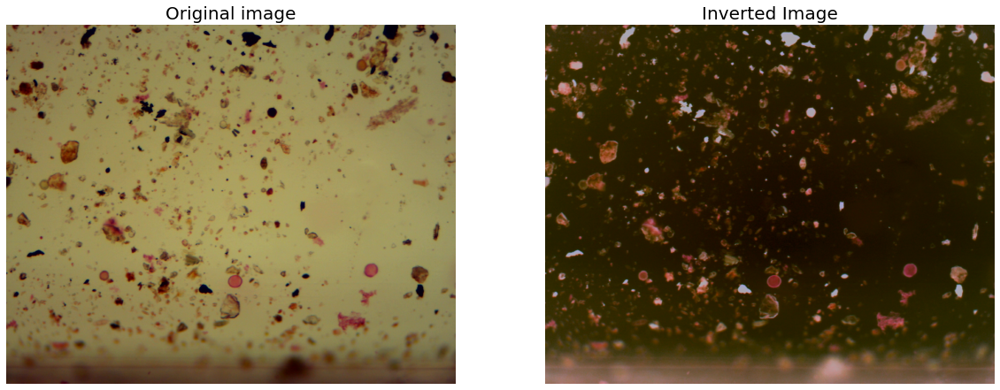

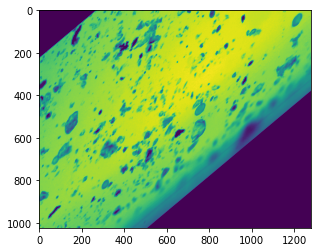

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


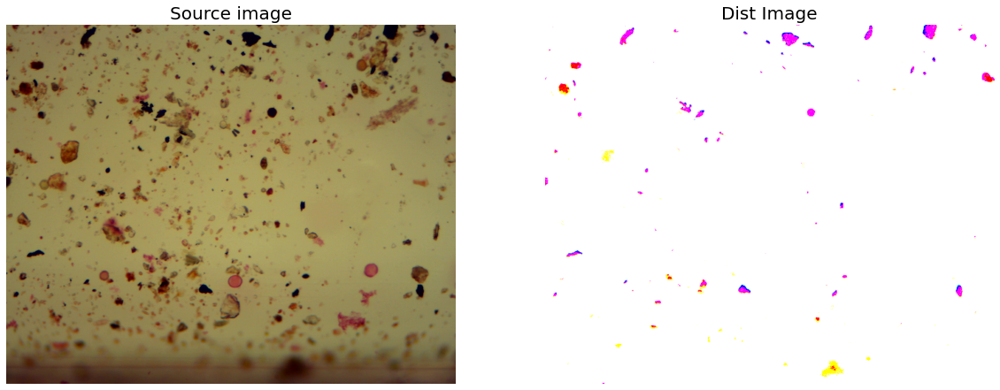

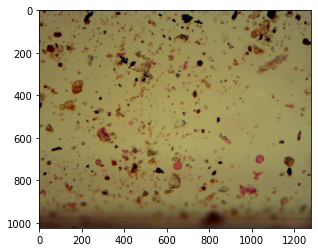

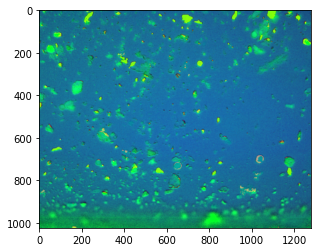

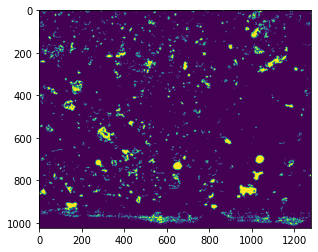

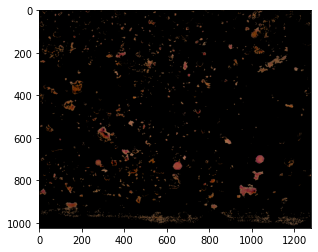

In [ ]:
dir = driveDir+"test.jpg"
img = ImageTransforms(dir)
img.transformColorSpace(True)
img.transformAffine()
img.transformPerspective()
img.detectObjects()

#Chapter 2 Image Enhancement

##Applying filters to denoise different types of noise in an image


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:19: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:20: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: UserWarning: DEPRECATED: skimage.measure.compare_psnr has been moved to skimage.metrics.peak_signal_noise_ratio. It will be removed from skimage.measure in version 0.18.


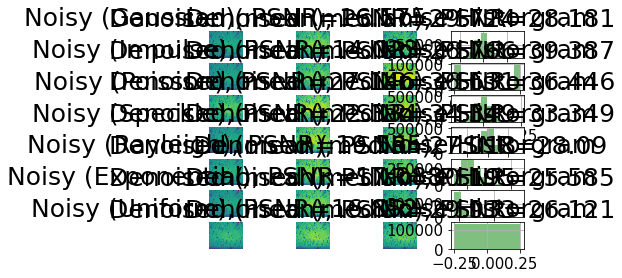

In [ ]:
%matplotlib inline
from skimage.io import imread
from skimage.util import random_noise
from skimage.color import rgb2gray
from skimage.measure import compare_psnr
from scipy.ndimage import uniform_filter, median_filter
import numpy as np
import matplotlib.pylab as plt

def plt_hist(noise, bins=None):
    plt.grid()
    plt.hist(np.ravel(noise), bins=bins, alpha=0.5, color='green')
    plt.tick_params(labelsize=15)
    plt.title('Noise Historgram', size=25)

def plt_images(im, im_noisy, noise, noise_type, i):
    im_denoised_mean = uniform_filter(im_noisy, 5)
    im_denoised_median = median_filter(im_noisy, 5)
    plt.subplot(7,4,i), plt.imshow(im_noisy), \
    plt.title('Noisy ({}), PSNR={}'.format(noise_type, \
    np.round(compare_psnr(im, im_noisy),3)), size=25), \
    plt.axis('off')
    plt.subplot(7,4,i+1), plt.imshow(im_denoised_mean), \
    plt.title('Denoised (mean), PSNR={}'.format(np.round\
    (compare_psnr(im, im_denoised_mean),3)), size=25), \
    plt.axis('off')
    plt.subplot(7,4,i+2), plt.imshow(im_denoised_median), \
    plt.title('Denoised (median), PSNR={}'.format(np.round\
    (compare_psnr(im, im_denoised_median),3)), size=25), \
    plt.axis('off')
    plt.subplot(7,4,i+3), plt_hist(noise)

im = rgb2gray(imread(driveDir+"test.jpg"))
im1 = random_noise(im, 'gaussian', var=0.15**2)
plt_images(im, im1, im1-im, 'Gaussian', 1)
im1 = random_noise(im, 's&p', amount=0.15)
plt_images(im, im1, im1[((im1==0)|(im1==1))&((im!=0)&(im!=1))],
'Impulse', 5)
noise = np.random.poisson(lam=int(np.mean(255*im)),
size=im.shape)/255 - np.mean(im)
im1 = np.clip(im + noise, 0, 1)
plt_images(im, im1, noise, 'Poisson', 9)
im1 = random_noise(im, 'speckle', var=0.15**2)
plt_images(im, im1, im1-im, 'Speckle', 13)
noise = np.random.rayleigh(scale=0.15, size=im.shape) - 0.15
im1 = np.clip(im + noise, 0, 1)
plt_images(im, im1, noise, 'Rayleigh', 17)
noise = np.random.exponential(scale=0.15, size=im.shape) - 0.15
im1 = np.clip(im + noise, 0, 1)
plt_images(im, im1, noise, 'Exponential', 21)
noise = np.random.uniform(0, 0.5, size=im.shape) - 0.25
im1 = np.clip(im + noise, 0, 1)
plt_images(im, im1, noise, 'Uniform', 25)

##Image denoising with a denoising autoencoder

input - origional image -> random noise added

output - denoised image -> compared to origional image

goal: denoising autoencoder that works for new images that are not part of the training or test sets


In [7]:
import os
import numpy as np
import matplotlib.pylab as plt
import torch
from torch import nn
from torch.autograd import Variable
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.utils import save_image
from sklearn.datasets import fetch_lfw_people

#1. Define the to_img() and plot_sample_img() functions to convert a PyTorch
#tensor to an image from the lfw dataset (each grayscale image has a size of 50 x
#37) and to save the image to disk, respectively:
def to_img(x):
    x = x.view(x.size(0), 1, 50, 37)
    return x

def plot_sample_img(img, name):
    img = img.view(1, 50, 37)
    save_image(img, './sample_{}.png'.format(name))

#2. Define the add_noise() function to add random Gaussian noise to an image:
def add_noise(img):
    noise = torch.randn(img.size()) * 0.2
    noisy_img = img + noise
    return noisy_img
#3. Implement the min_max_normalization() and tensor_round()
#preprocessing functions to normalize and round a tensor, respectively. Also,
#create a transformation pipeline with the functions defined:
def min_max_normalization(tensor, min_value, max_value):
    min_tensor = tensor.min()
    tensor = (tensor - min_tensor)
    max_tensor = tensor.max()
    tensor = tensor / max_tensor
    tensor = tensor * (max_value - min_value) + min_value
    return tensor

def tensor_round(tensor):
    return torch.round(tensor)

img_transform = transforms.Compose([
transforms.ToTensor(),
transforms.Lambda(lambda tensor:min_max_normalization(tensor, \
0, 1)),transforms.Lambda(lambda tensor:tensor_round(tensor))])

#4. Download the lfw dataset and create a dataloader with a batch size of 8:
batch_size = 8 # 16
dataset = fetch_lfw_people(min_faces_per_person=70, \
resize=0.4).images / 255

dataloader = DataLoader(dataset, batch_size=batch_size, \
shuffle=True)

#5. Now, implement the autoencoder class, the encoder and decoder members, and
#the forward() method of the class:
class autoencoder(nn.Module):
    def __init__(self):
        super(autoencoder, self).__init__()
        self.encoder = nn.Sequential(nn.Linear(50 * 37, 512),nn.ReLU(True),nn.Linear(512, 128),nn.ReLU(True))
        self.decoder = nn.Sequential(nn.Linear(128, 512),nn.ReLU(True),nn.Linear(512, 50 * 37),nn.Sigmoid())

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

#6. Instantiate the autoencoder class, and then define the loss function as binary
#cross-entropy (BCE) loss and the optimizer as the Adam optimizer using the
#following code snippet:
learning_rate = 1e-3
cuda = False
model = autoencoder()
if cuda:
    model = model.cuda()
criterion = nn.BCELoss()
optimizer = torch.optim.Adam(model.parameters(), \
lr=learning_rate, weight_decay=1e-5)

#7. Train the autoencoder for 100 epochs. In every epoch, use forward propagation
#for autoencoder prediction (and loss function computation) and backpropagation
#to update the weights in different layers:
num_epochs = 100
for epoch in range(1, num_epochs+1):
    for data in dataloader:
        img = data
        img = to_img(img)
        noisy_img = add_noise(img)

        if cuda: 
            noisy_img = noisy_img.cuda()
        img = Variable(img)
        if cuda: 
            img = img.cuda()
        output = model(noisy_img) # forward-prop
        loss = criterion(output, img)
        MSE_loss = nn.MSELoss()(output, img)
        optimizer.zero_grad()
        loss.backward() # back-prop
        optimizer.step()
        print('epoch [{}/{}], loss:{:.4f}, MSE_loss:{:.4f}'.format(epoch, num_epochs, loss.data.item(),MSE_loss.data.item()))
        if epoch % 10 == 0:
            x = to_img(img.cpu().data)
            x_hat = to_img(output.cpu().data)
            x_noisy = to_img(noisy_img.cpu().data)
            weights = to_img(model.encoder[0].weight.cpu().data)

RuntimeError: ignored

##Image denoising with PCA/DFT/DWT


##Image denoising with anisotropic diffusion


In [12]:
!pip install medpy
from medpy.filter.smoothing import anisotropic_diffusion
from skimage.util import random_noise
from skimage.io import imread
from skimage import img_as_float
import matplotlib.pylab as plt
import numpy as np
#1. First, read the cameraman grayscale image from disk and add random Gaussian
#noise (with a variance of 0.025) to it. Clip the noisy image to have values #strictly
#between 0 and 1 (inclusive):
img = img_as_float(imread(driveDir+"test.jpg"))
noisy = random_noise(img, var=0.05)
noisy = np.clip(noisy, 0, 1)
#2. Plot the original and noisy images:
plt.figure(figsize=(15,18))
plt.gray()
plt.subplots_adjust(0,0,1,1,0.05,0.05)
plt.subplot(221), plt.imshow(img), plt.axis('off'),
plt.title('Original', size=20)
plt.subplot(222), plt.imshow(noisy), plt.axis('off'),
plt.title('Noisy', size=20)
#3. Apply anisotropic diffusion (according to Perona-Malik equation 1) with
#parameters of kappa=20 and niter=20 to denoise the noisy image. Plot the
#smoothed image:
diff_out = anisotropic_diffusion(noisy, niter=20, kappa=20,
option=1)
plt.subplot(223), plt.imshow(diff_out), plt.axis('off'), \
plt.title(r'Anisotropic Diffusion (Perona Malik eq 1, \
iter=20, $\kappa=20$)', size=20)
#4. Again, apply anisotropic diffusion (according to Perona-Malik equation 2 this
#time), with parameters of kappa=50 and niter=50 to denoise the noisy image.
#Plot the smoothed image:
diff_out = anisotropic_diffusion(noisy, niter=50, kappa=50,
option=2)
plt.subplot(224), plt.imshow(diff_out), plt.axis('off'), \
plt.title(r'Anisotropic Diffusion (Perona Malik eq 2, \
iter=50, $\kappa=50$)', size=20)
plt.show()

Output hidden; open in https://colab.research.google.com to view.

##Improving image contrast with histogram equalization


/usr/local/lib/python3.6/dist-packages/skimage/exposure/exposure.py:181: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  hist, bin_centers = histogram(image, nbins)


Text(0.5, 1.0, 'Hist')

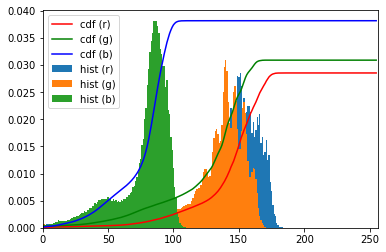

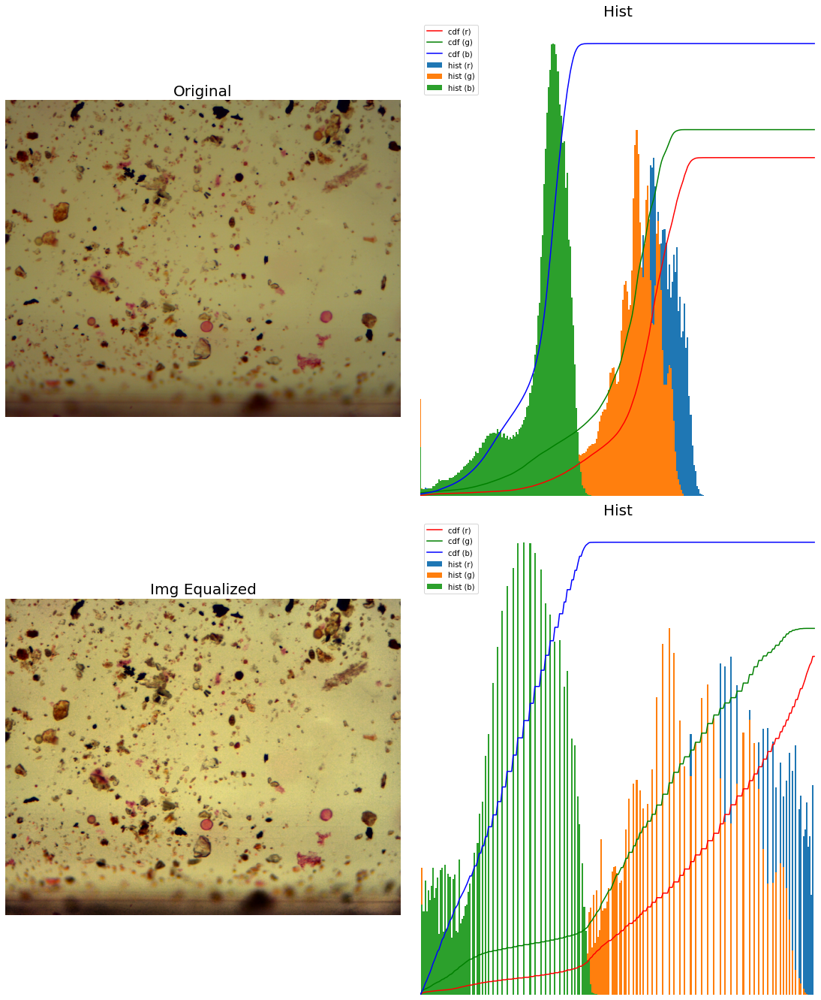

In [20]:
import numpy as np
import matplotlib.pylab as plt
from skimage.io import imread
from skimage.exposure import equalize_hist, equalize_adapthist

#1. Define the plot_image() and plot_hist() functions to display an image and
#return its cumulative distribution function (cdf), respectively:
def plot_image(image, title):
    plt.imshow(image)
    plt.title(title, size=20)
    plt.axis('off')
def plot_hist(img):
    colors = ['r', 'g', 'b']
    cdf = np.zeros((256,3))
    for i in range(3):
        hist, bins = np.histogram(img[...,i].flatten(),256,[0,256],density = True)
        cdf[...,i] = hist.cumsum()
        cdf_normalized = cdf[...,i] * hist.max() / cdf.max()
        plt.plot(cdf_normalized, color = colors[i], \
        label='cdf ({})'.format(colors[i]))
        binWidth = bins[1] - bins[0]
        plt.bar(bins[:-1], hist*binWidth, binWidth,
        label='hist ({})'.format(colors[i]))
        plt.xlim([0,256])
        plt.legend(loc = 'upper left')
    return cdf

#2. Implement the histogram equalization by reassigning the pixel values with the
#corresponding cdf value for that pixel using the following code:
img = imread(driveDir+"test.jpg")
cdf = plot_hist(img)
img2 = np.copy(img)
for i in range(3):
    cdf_m = np.ma.masked_equal(cdf[...,i],0)
    cdf_m = (cdf_m - cdf_m.min())*255/(cdf_m.max()-cdf_m.min())
    # min-max normalize
    cdf2 = np.ma.filled(cdf_m,0).astype('uint8')
    img2[...,i] = cdf2[img[...,i]]

#3. Perform histogram equalization with the same input image using scikit-image
#library functions that implement global and adaptive histogram equalization:
equ1 = (255*equalize_hist(img)).astype(np.uint8)
equ2 = (255*equalize_adapthist(img)).astype(np.uint8)

#4. Plot
plt.figure(figsize=(15,18))
plt.subplots_adjust(0,0,1,1,0.05,0.05)
plt.subplot(221), plot_image(img,"Original")
plt.subplot(222), plot_hist(img),plt.axis('off'),
plt.title('Hist', size=20)
plt.subplot(223), plot_image(equ2,"Img Equalized")
plt.subplot(224), plot_hist(equ1),plt.axis('off'),
plt.title('Hist', size=20)

##Implementing histogram matching


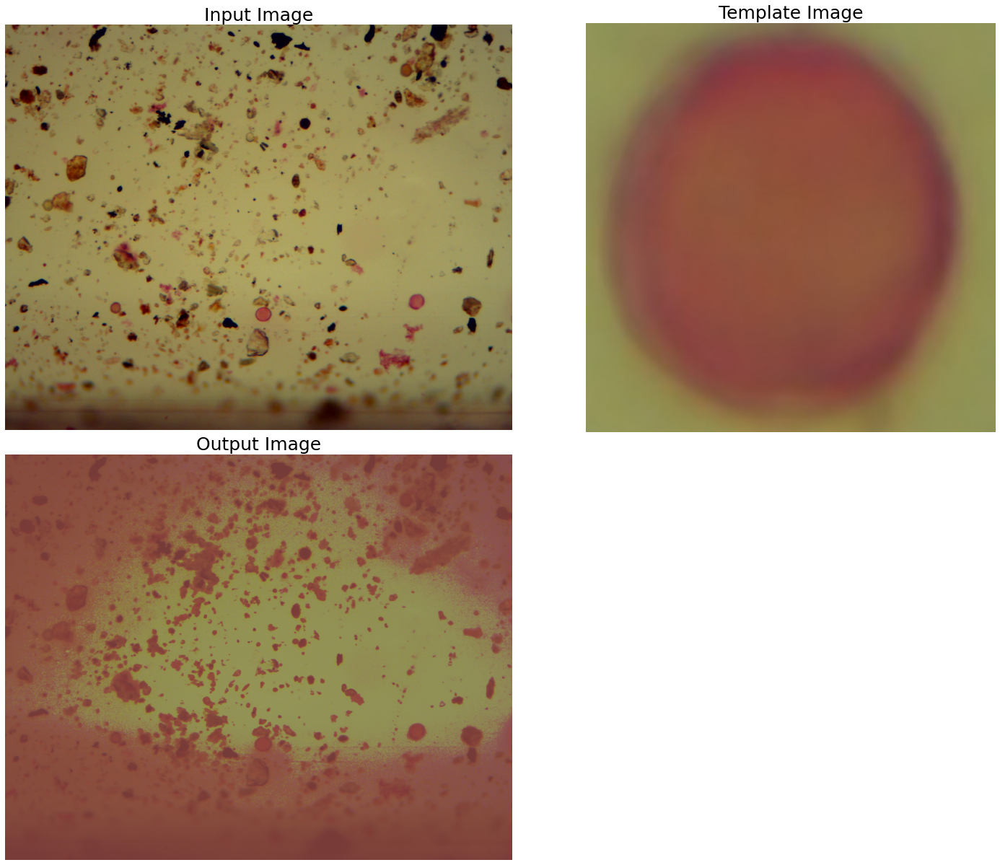

In [24]:
from skimage.exposure import cumulative_distribution
from skimage.color import rgb2gray
import matplotlib.pylab as plt
import numpy as np

#1. Let's implement the histogram-matching algorithm with
#the hist_matching() function, which accepts the original and the template
#image's cdf along with the original image:
def hist_matching(c, c_t, im):
    b = np.interp(c, c_t, np.arange(256))
    # find closest matches to b_t
    pix_repl = {i:b[i] for i in range(256)}
    # dictionary to replace the pixels
    mp = np.arange(0,256)
    for (k, v) in pix_repl.items():
        mp[k] = v
    s = im.shape
    im = np.reshape(mp[im.ravel()], im.shape)
    im = np.reshape(im, s)
    return im

#2. Compute cdf of an image with the following function:
def cdf(im):
    c, b = cumulative_distribution(im)
    for i in range(b[0]):
        c = np.insert(c, 0, 0)
    for i in range(b[-1]+1, 256):
        c = np.append(c, 1)
    return c

#3. Finally, read the input and template images, compute their cdfs, and create the
#output image with the hist_matching() function. Plot the input, template, and
#output images by running the following code:
im = imread(driveDir+"test.jpg").astype(np.uint8)
im_t = imread(driveDir+"mask.jpg")
im1 = np.zeros(im.shape).astype(np.uint8)
for i in range(3):
    c = cdf(im[...,i])
    c_t = cdf(im_t[...,i])
    im1[...,i] = hist_matching(c, c_t, im[...,i])
plt.figure(figsize=(20,17))
plt.subplots_adjust(left=0, top=0.95, right=1, bottom=0, \
wspace=0.05, hspace=0.05)
plt.subplot(221), plt.imshow(im), plt.axis('off'), \
plt.title('Input Image', size=25)
plt.subplot(222), plt.imshow(im_t), plt.axis('off'), \
plt.title('Template Image', size=25)
plt.subplot(223), plt.imshow(im1[...,:3]), plt.axis('off'), \
plt.title('Output Image', size=25)
plt.show()

##Performing gradient blending


In [ ]:
##image
src = cv2.imread("images/liberty.png")

##Dest image
dst = cv2.imread("images/victoria.png")

##mask
src_mask = cv2.imread("images/cmask.png")
print(src.shape, dst.shape, src_mask.shape)

##Run seamless cloning to blend the masked source around a center in the
#destination image and save the output image:
center = (275,250)
output = cv2.seamlessClone(src, dst, src_mask, center, \
cv2.MIXED_CLONE)


##Edge detection with Canny, LoG/zero-crossing, and wavelets

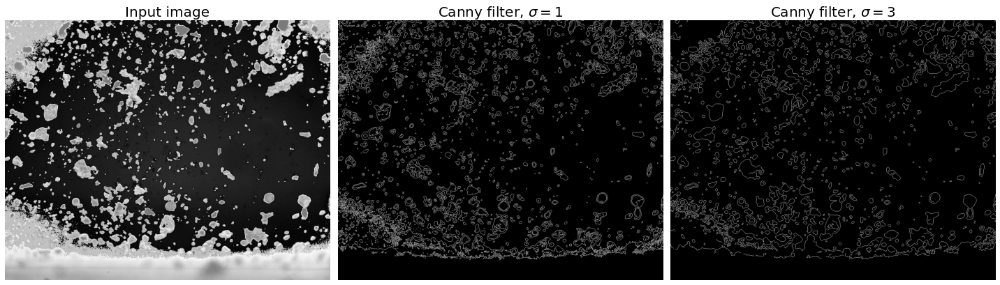

In [26]:
#Canny

import numpy as np
from scipy import ndimage, misc
import matplotlib.pyplot as plt
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
import pywt
import SimpleITK as sitk


#1. Read the input grayscale image and convert it to the float64 datatype:
image = sitk.ReadImage(driveDir+"test.jpg", sitk.sitkInt8)
# 8-bit cameraman grayscale image
image = sitk.Cast(image, sitk.sitkFloat64)

#2. Compute the Canny filter for two values of σ of the Gaussian blur (1 and 3) with
#the same hysteresis thresholds:
edges1 = sitk.CannyEdgeDetection(image, lowerThreshold=5, \
upperThreshold=10, variance=[1, 1])
edges2 = sitk.CannyEdgeDetection(image, lowerThreshold=5, \
upperThreshold=10, variance=[3, 3])

#3. Convert the output to the NumPy array for display:
image = sitk.GetArrayFromImage(image)
edges1 = sitk.GetArrayFromImage(edges1)
edges2 = sitk.GetArrayFromImage(edges2)

#4. Display the input and edge images:
fig = plt.figure(figsize=(20, 6))
plt.subplot(131), plt.imshow(image, cmap=plt.cm.gray), \
plt.axis('off')
plt.title('Input image', fontsize=20)
plt.subplot(132), plt.imshow(edges1, cmap=plt.cm.gray), \
plt.axis('off')
plt.title('Canny filter, $\sigma=1$', fontsize=20)
plt.subplot(133), plt.imshow(edges2, cmap=plt.cm.gray), \
plt.axis('off')
plt.title('Canny filter, $\sigma=3$', fontsize=20)
fig.tight_layout()
plt.show()

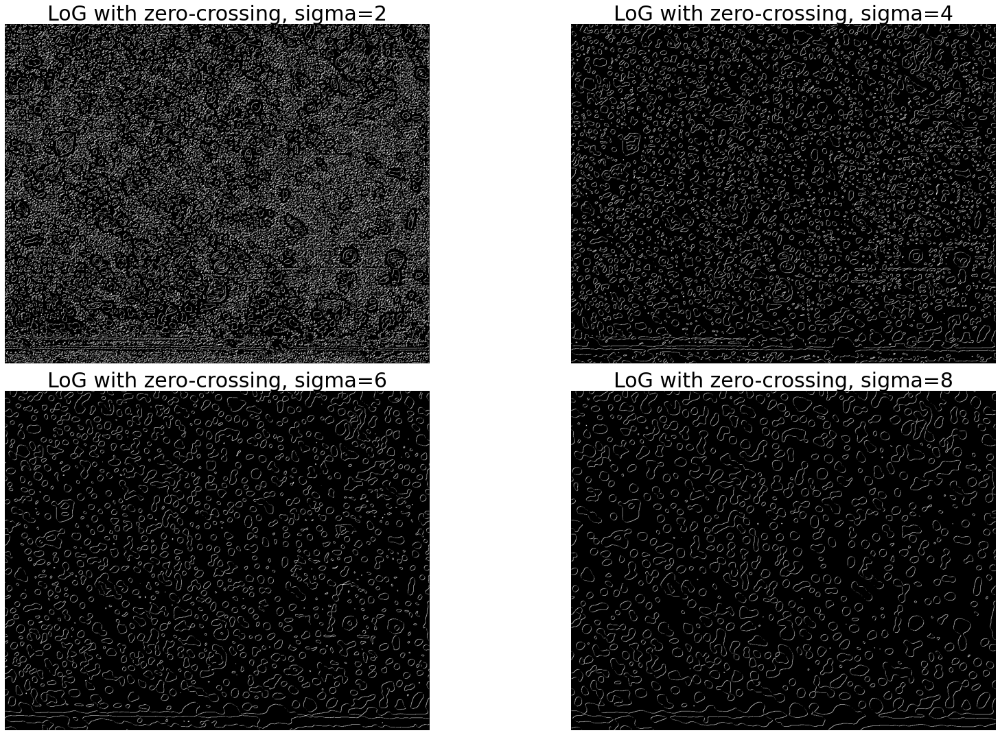

In [28]:
from skimage.io import imread
#LoG/zero-crossing
#1. First, let's define the any_neighbor_zero() function that takes a pixel in an
#image as input and returns True if any of the pixel's (8-connected) neighbors are
#zero:
def any_neighbor_zero(img, i, j):
    for k in range(-1,2):
        for l in range(-1,2):
            if k == 0 and l == 0: 
                continue # skip the input pixel
            if img[i+k, j+k] == 0:
                return True
    return False

#2. Next, let's define the zero_crossing() function:
def zero_crossing(img):
    img[img > 0] = 1
    img[img < 0] = 0
    out_img = np.zeros(img.shape)
    for i in range(1,img.shape[0]-1):
        for j in range(1,img.shape[1]-1):
            if img[i,j] > 0 and any_neighbor_zero(img, i, j):
                out_img[i,j] = 255
    return out_img

#3. Finally, invoke the zero_crossing() function on the LoG-convolved input
#image and plot the output:
img = rgb2gray(imread(driveDir+"test.jpg"))
fig = plt.figure(figsize=(25,15))
plt.gray() # show the filtered result in grayscale
for sigma in range(2,10, 2):
    plt.subplot(2,2,sigma/2)
    result = ndimage.gaussian_laplace(img, sigma=sigma)
    result = zero_crossing(result)
    plt.imshow(result)
    plt.axis('off')
    plt.title('LoG with zero-crossing, sigma=' + str(sigma), size=30)
plt.tight_layout()
plt.show()

#Chapter 3 Image Restoration

##Restoring an image with the Wiener filter


In [12]:
from skimage.io import imread
from skimage.color import rgb2gray
import numpy as np
import matplotlib.pylab as plt
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from skimage import restoration
im = rgb2gray(imread(driveDir+"test.jpg"))

def convolve2d(im, psf, k):
    M, N = im.shape
    freq = np.fft.fft2(im)
    # assumption: min(M,N) > k > 0, k odd
    psf = np.pad(psf, (((M-k)//2,(M-k)//2+1), \
    ((N-k)//2,(N-k)//2+1)), mode='constant')
    freq_kernel = np.fft.fft2(np.fft.ifftshift(psf))
    return np.abs(np.fft.ifft2(freq*freq_kernel))

k = 5
psf = np.ones((k, k)) / k**2 # box blur
im1 = convolve2d(im, psf, k)

im1 += 0.2 * im.std() * np.random.standard_normal(im.shape)

im2, _ = restoration.unsupervised_wiener(im1, psf)

im3 = restoration.wiener(im1, psf, balance=0.25)

##Plot
fig = plt.figure(figsize=(200, 60))
plt.subplot(221), plt.imshow(im, cmap=plt.cm.gray), \
plt.axis('off')
plt.title('Input image', fontsize=100)
plt.subplot(222), plt.imshow(im1, cmap=plt.cm.gray), \
plt.axis('off')
plt.title('Noisy Blur', fontsize=100)
plt.subplot(223), plt.imshow(im2, cmap=plt.cm.gray), \
plt.axis('off')
plt.title('Self tuned Wiener restoration', fontsize=100)
plt.subplot(224), plt.imshow(im3, cmap=plt.cm.gray), \
plt.axis('off')
plt.title('Wiener restoration', fontsize=100)
fig.tight_layout()
plt.show()

def plot_freq_spec_3d(freq):
    fig = plt.figure(figsize=(10,10))
    ax = fig.gca(projection='3d')
    Y = np.arange(-freq.shape[0]//2,freq.shape[0]-freq.shape[0]//2)
    X = np.arange(-freq.shape[1]//2,freq.shape[1]-freq.shape[1]//2)
    X, Y = np.meshgrid(X, Y)
    Z = (20*np.log10( 0.01 + np.fft.fftshift(freq))).real
    surf = ax.plot_surface(X, Y, Z, cmap=plt.cm.coolwarm, \
    linewidth=0, antialiased=True)
    ax.zaxis.set_major_locator(LinearLocator(10))
    ax.zaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    plt.show()
plot_freq_spec_3d(np.fft.fft2(im))
plot_freq_spec_3d(np.fft.fft2(im1))
plot_freq_spec_3d(np.fft.fft2(im2))
plot_freq_spec_3d(np.fft.fft2(im3))

Output hidden; open in https://colab.research.google.com to view.

##Recovering an image with the CLS filter

In [9]:
import numpy as np
import scipy.fftpack as fp
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.restoration import wiener, unsupervised_wiener
from skimage.metrics import peak_signal_noise_ratio
import matplotlib.pylab as plt

#1. First, define the cls_filter() function to implement the constrained least
#squares filter:
def cls_filter(y,h,c,lambd):
    Hf = fp.fft2(fp.ifftshift(h))
    Cf = fp.fft2(fp.ifftshift(c))
    Hf = np.conj(Hf) / (Hf*np.conj(Hf) + lambd*Cf*np.conj(Cf))
    Yf = fp.fft2(y)
    I = Yf*Hf
    im = np.abs(fp.ifft2(I))
    return (im, Hf)

def pseudo_inverse_filter(x,y,h,epsilon):
    H = y/x
    G = 1/H
    PIF = np.zeros(G.shape)
    PIF[np.abs(h)>=epsilon] = G[np.abs(h) >=epsilon]
    rec_fft_PIF = y*PIF
    rec_PIF = fp.ifft2(rec_fft_PIF).real
    return PIF, rec_PIF

#2. Read the input image and convert it into grayscale. Blur the input grayscale
#image using box-kernel (done in the frequency domain) and degrade the image
#using White Gaussian Noise (WGN) with a given standard deviation (σ):
x = rgb2gray(imread(driveDir+"test.jpg"))
M, N = x.shape
h = np.ones((4,4))/16 # blur filter
h = np.pad(h, [(M//2-2, M//2-2), (N//2-2, N//2-2)], \
mode='constant')
sigma = 0.05
Xf = fp.fft2(x)
Hf = fp.fft2(fp.ifftshift(h))
Y = Hf*Xf
y = fp.ifft2(Y).real + sigma*np.random.normal(size=(M,N))
#3. Apply the pseudo_inverse filter on the degraded image to get back the
#restored image along with the frequency response of the pseudo-inverse filter
#kernel:

epsilon = 0.25
pix, F_pseudo = pseudo_inverse_filter(x,y, h, epsilon)

#4. Apply the wiener filter with the balance parameter as 0.25 to get back the
#restored image:
wx = wiener(y, h, balance=0.25)
#5. Next, apply the unsupervised_wiener filter to get back the restored image:
uwx, _ = unsupervised_wiener(y, h)
#6. Construct the high-pass filter (2D Laplacian) and convert it into the frequency
#domain, to use it as the constraint-kernel. Apply the CLS filter on the degraded
#image using the constraint kernel created, along with a regularization parameter
#(λ) value:
c = np.array([[0,1/4,0],[1/4,-1,1/4],[0,1/4,0]])
c = np.pad(c, [(M//2-1, M//2-2), (N//2-2, N//2-1)], \
mode='constant')
Cf = fp.fft2(fp.ifftshift(c))
lambd = 20
clx, F_restored = cls_filter(y, h, c, lambd)
print(r'Restored (CLS, $\lambda=${}) PSNR: {}'.format(lambd,np.round(peak_signal_noise_ratio(x, clx),3)))


##Plot
fig = plt.figure(figsize=(200, 60))
plt.subplot(221), plt.imshow(x, cmap=plt.cm.gray), \
plt.axis('off')
plt.title('Input image', fontsize=100)
plt.subplot(222), plt.imshow(y, cmap=plt.cm.gray), \
plt.axis('off')
plt.title('Noisy Blur', fontsize=100)
plt.subplot(223), plt.imshow(pix, cmap=plt.cm.gray), \
plt.axis('off')
plt.title('Self tuned Wiener restoration', fontsize=100)
plt.subplot(224), plt.imshow(wx, cmap=plt.cm.gray), \
plt.axis('off')
plt.title('Wiener restoration', fontsize=100)
fig.tight_layout()
plt.show()

Output hidden; open in https://colab.research.google.com to view.


##Image restoration with a Markov random field


In [ ]:
import numpy as np
from skimage.color import rgb2gray
import matplotlib.pylab as plt

#1. Let's first implement the read_image_and_binarized() function to read the
#image and binarize (as pre-processing step). Note that the output binary image
#will have pixels with values from {-1, 1}:
def read_image_and_binarize(image, threshold=128):
    im = (rgb2gray(plt.imread(image))).astype(int)
    im[im < threshold] = -1
    im[im >= threshold] = 1
    return im
#2. Let's implement the compute_energy_helper() functions to compute the
##energy as a function of the noisy input image, X, and the output denoised
#image, Y, to be generated:
def compute_energy_helper(Y, i, j):
    try:
        return Y[i][j]
    except IndexError:
        return 0
def compute_energy(X, Y, i, j, zeta, eta, Y_i_j):
    energy = -eta * X[i][j] * Y_i_j
    for (k, l) in [(-1,0),(1,0),(0,-1),(0,1)]: # 4-connected nbd
        energy -= zeta * Y_i_j * compute_energy_helper(Y, i+k, j+l)
    return energy
#3. Let's now implement a function to add noise to the image. The following
#function typically adds 10% noise to the image:
def add_noise(im):
    im_noisy = im.copy()
    for i in range(im_noisy.shape[0]):
        for j in range(im_noisy.shape[1]):
            r = np.random.rand()
            if r < 0.1:
                im_noisy[i][j] = -im_noisy[i][j]
    return im_noisy

#4. Next, let's implement the denoise_image() function, which actually denoises
#the image iteratively (typically, it runs for several iterations equal to 10 times the
#image size):
def denoise_image(O, X, zeta, eta):
    m, n = np.shape(X)
    Y = np.copy(X)
    max_iter = 10*m*n
    iters = []
    errors = []
    for iter in range(max_iter):
        # randomly pick a location
        i, j = np.random.randint(m), np.random.randint(n)

#Compute energies for Yij 5. = +1 and -1:
energy_neg = compute_energy(X, Y, i, j, zeta, eta, -1)
energy_pos = compute_energy(X, Y, i, j, zeta, eta, 1)

#Assign Yij 6. to the value with minimum energy:
if energy_neg < energy_pos:
    Y[i][j] = -1
else:
    Y[i][j] = 1
#7. If the iteration is a multiple of 100,000, print the error in the reconstructed image.
#Plot how the error changes with iterations and return the output image
#recovered:
if iter % 100000 == 0:
    print ('Completed', iter, 'iterations out of', max_iter)
    error = get_mismatched_percentage(O, Y)
    iters.append(iter)
    errors.append(error)
plot_error(iters, errors)
return Y

#8. Finally, invoke the functions to read and binarize the input image, add 10% noise
#to it, and denoise using an MRF with energy minimization using the functions
#defined earlier, after initializing the parameters ς and η:
orig_image = read_image_and_binarize('images/cameraman.png')
zeta = 1.5
eta = 2
noisy_image = add_noise(orig_image)
denoised_image = denoise_image(orig_image, noisy_image, w_e, w_s)
print ('Percentage of mismatched pixels: ', \
get_mismatched_percentage(orig_image, denoised_image))
plot_images(orig_image, noisy_image, denoised_image)

##Image inpainting


##Image completion with inpainting using deep learning


##Image restoration with dictionary learning


##Image compression with wavelets


In [11]:
import numpy as np
!pip install mahotas
import mahotas
from mahotas.thresholding import soft_threshold
from matplotlib import pyplot as plt
import os

#1. First, read the input image and convert it into grayscale:
im = mahotas.imread('images/cameraman.png', as_grey=True)
im = im.astype(np.uint8)
print(im.shape)
# (256,256)
f = np.mean(im==0)
print("Fraction of zeros in original image: {}".format(f))
# Fraction of zeros in original image: 0.0021514892578125
#2. Try a baseline compression method using simple down-sampling (by saving
#every other pixel) and saving only the high-order bits:
im1 = im[::2,::2].copy()
im1 = im1 / 8
im1 = im1.astype(np.uint8)
f1 = np.mean(im1==0)
print("Fraction of zeros in original image (after division \
by 8): {}".format(f1))
# Fraction of zeros in original image (after division by 8):
#0.01788330078125
#3. Even though you have thrown away 75% of the values in the image in the
#previous step, still there are only a few zeros. Let's now transform the image
#using a Daubechies wavelet (D8) and then discard the low-order bits. Check
#whether you got a better image with the same number of values used:
imw = mahotas.daubechies(mahotas.wavelet_center(im),'D8')
imw /= 8 # discard lower order bits
imw = imw.astype(np.int8)
f2 = np.mean(imw==0)
print("Fraction of zeros in wavelet transform (after division \
by 8): {}".format(f2))
# Fraction of zeros in wavelet transform (after division by 8):
0.8892402648925781
im2 = mahotas.wavelet_decenter(mahotas.idaubechies(imw, 'D8'), \
im.shape)
# min-max normalization to have pixel values in between 0-255
im2 = (255 * (im2 - np.min(im2)) / (np.max(im2) - \
np.min(im2))).astype(np.uint8)

     |████████████████████████████████| 5.7MB 4.6MB/s 


##Using steganography and steganalysis

#Chapter 4



##Applying morphological operators to a binary image


##Applying morphological filters


##Morphological pattern matching



##Segmenting images with morphology



##Counting objects